# getting started

welcome to **yabplot**! this library provides a unified interface for plotting brain data across three domains: cortical surfaces, subcortical volumes, and white matter tracts.

in this tutorial, we will cover:
1. checking what atlases are available.
2. basic plotting functions for cortex, subcortex, and tracts.
3. customizing views, layouts, and figure sizes.
4. exporting high-resolution images.

In [1]:
import os
import yabplot as yab
import matplotlib.pyplot as plt

work_dir = "tutorial_data"
os.makedirs(work_dir, exist_ok=True)

# 1. check availability
# yabplot manages downloads automatically. let's see what is available.
resources = yab.get_available_resources()

print("cortical atlases:", resources.get('cortical'))
print("subcortical atlases:", resources.get('subcortical'))
print("tract atlases:", resources.get('tracts'))

cortical atlases: ['aal3', 'aparc', 'brainnetome', 'schaefer100', 'schaefer1000', 'schaefer200', 'schaefer300', 'schaefer400']
subcortical atlases: ['aal3', 'aal3_nocer', 'aseg', 'brainnetome_sc', 'musus100', 'musus100_dbn', 'musus100_tha', 'tian2020_s1']
tract atlases: ['hcp1065_medium', 'hcp1065_small', 'hcp1065_tiny', 'xtract_large', 'xtract_medium', 'xtract_small', 'xtract_tiny']


## 1. plotting the cortex
the `plot_cortical` function renders data on the conte69 surface. if no data is provided, it shows the atlas regions colored categorically.

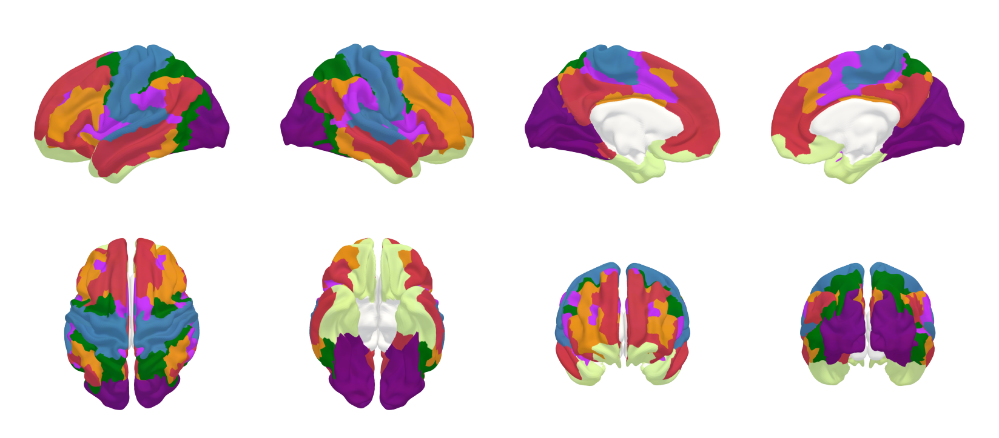

In [2]:
# basic plot with default settings
# note: default plotting is to matplotlib axes (display_type='matplotlib')
# change to 'interactive' to open a rotatable window.
ax = yab.plot_cortical(atlas='schaefer1000', display_type='matplotlib')

## 2. views and layouts
you can easily change the camera angles or the grid layout. `views` accepts a list of presets like `'left_lateral'`, `'superior'`, `'anterior'`, etc.

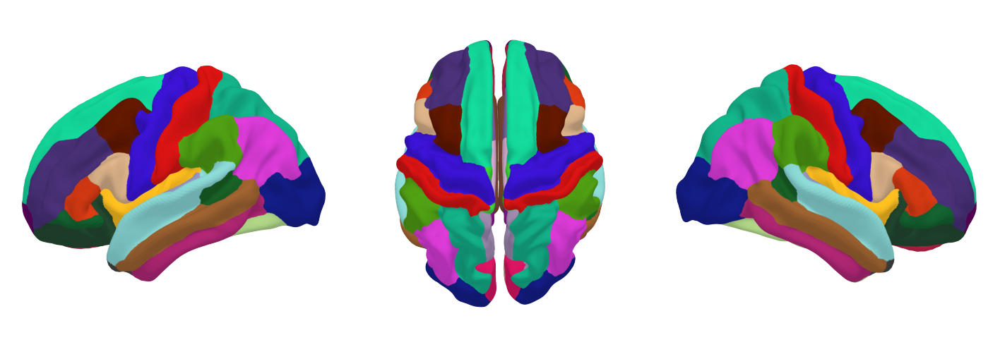

In [3]:
# showing multiple views with a custom layout
# layout=(rows, cols). here we want 1 row, 3 columns.
ax = yab.plot_cortical(
    atlas='aparc',
    views=['left_lateral', 'superior', 'right_lateral'],
    layout=(1, 3), # modify the layout
    figsize=(12, 4), # change figure size
    proc_vertices='sharp' # parameter for plot_cortical() for higher quality plots (it is default, but computationally heavier than proc_vertices=None)
)

## 3. subcortical structures
`plot_subcortical` renders 3d meshes for volumetric structures.

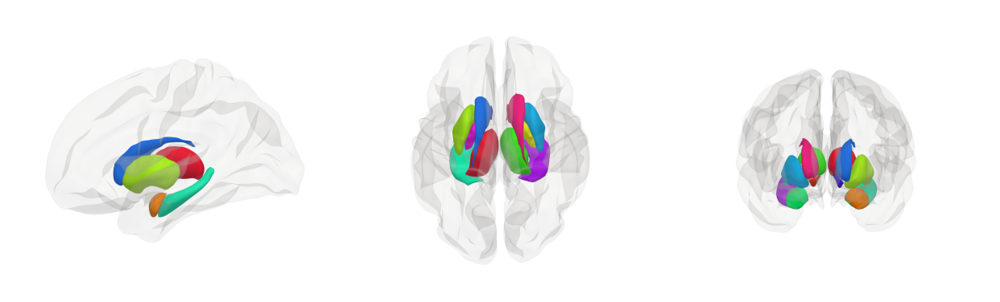

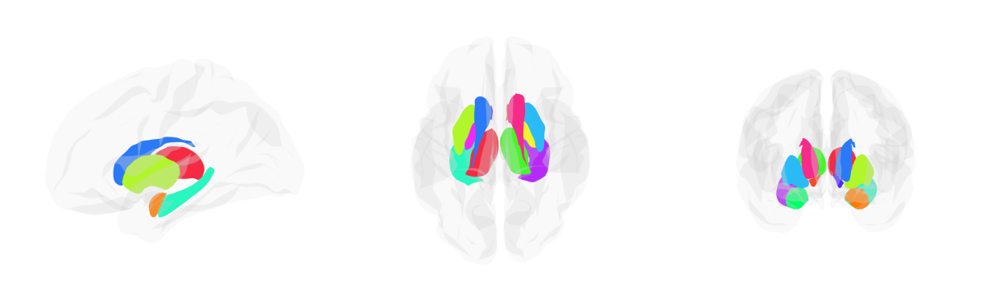

In [4]:
# plot the 'aseg' atlas with a sculpted lighting style
ax = yab.plot_subcortical(
    atlas='aseg',
    views=['left_lateral', 'superior', 'anterior'],
    style='sculpted',
)
# same but now with flat style
ax = yab.plot_subcortical(
    atlas='aseg',
    views=['left_lateral', 'superior', 'anterior'],
    style='flat',
)

## 4. white matter tracts
`plot_tracts` renders streamlines. you can also color them by orientation (standard dti colors: red=l/r, green=a/p, blue=s/i).

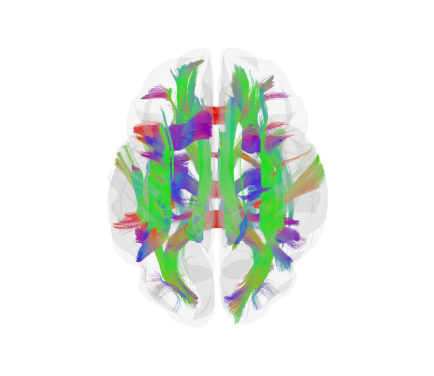

In [5]:
# coloring tracts by orientation
ax = yab.plot_tracts(
    atlas='xtract_large',
    orientation_coloring=True,
    views=['superior'],
    style='matte',
    bmesh='pial', # custom brain meshes
)

## 5. interactivity and animation
use the `display_type` argument to choose the way the figure is displayed. moreover, you can modify the pyvista plotter object after running the yabplot functions as in below where we create an animated image with rotating brain.

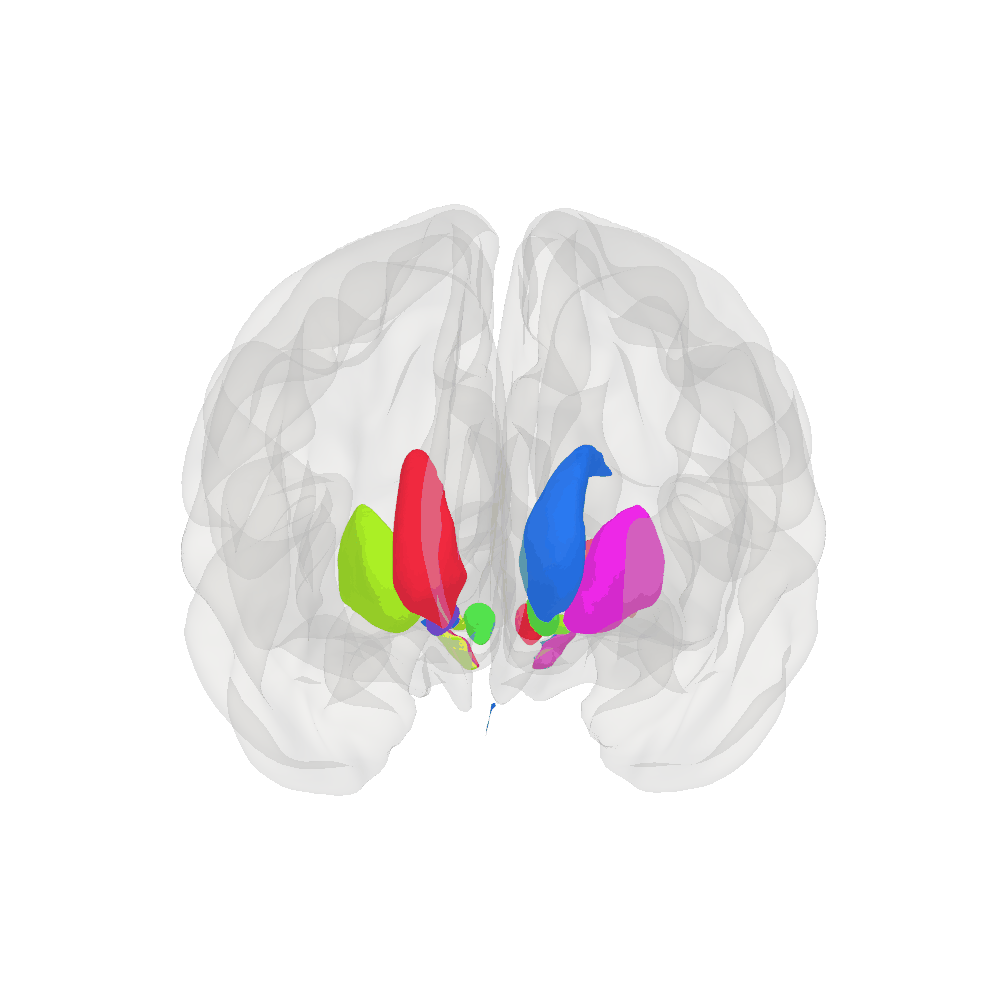

In [6]:
p = yab.plot_subcortical(
    atlas='musus100_dbn', 
    views=['anterior'],
    figsize=(5, 5),
    display_type='object' # set to 'interactive' for interactivity, 
    # currently we set it to 'object' to make changes to it afterwards
)

# open a gif file
gif_path = os.path.join(work_dir, "brain_rotation.gif")
p.open_gif(gif_path)

# rotate the camera 360 degrees by 5 frames
for angle in range(0, 360, 5):
    p.camera.azimuth += 5
    p.write_frame()
p.close()

from IPython.display import display, Image
display(Image(filename=gif_path))

## 6. saving figures
use the `export_path` argument to save your plot to a file ('.svg', '.eps', '.ps', '.pdf', '.tex', '.png', '.jpeg', '.jpg', '.bmp', '.tiff').

In [7]:
# save a figure without showing it inline (display_type=None)
yab.plot_cortical(
    atlas='schaefer100',
    export_path=os.path.join(work_dir, "my_figure.png"),
    display_type=None
)

print(f"saved figure to: {os.path.join(work_dir, 'my_figure.png')}")

saved figure to: tutorial_data/my_figure.png


## 7. multi-panel figure with matplotlib

combine your brain plots with any other matplotlib-based subplots including other yabplot brains

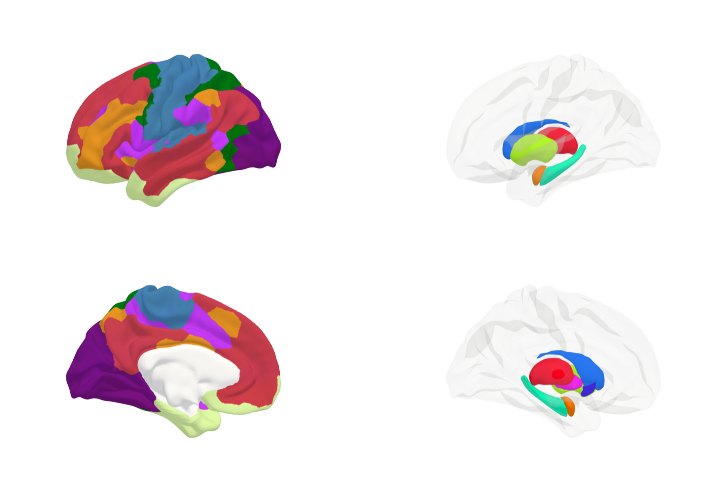

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(6, 4), dpi=150)
axes[0] = yab.plot_cortical(atlas='schaefer400', layout=(2, 1), views=['left_lateral', 'left_medial'], ax=axes[0])
axes[1] = yab.plot_subcortical(atlas='aseg', layout=(2, 1), views=['left_lateral', 'left_medial'], ax=axes[1])
plt.show()